In [1]:
import os
import PIL
import glob
import time
import imageio
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from IPython import display
from keras.utils import plot_model
from tensorflow.keras import layers
from matplotlib.pylab import rcParams

%matplotlib inline

# 1. CIFAR-10 dataset load

> CIFAR-10는 10가지의 이미지로 구성되어있으며, 종류는 아래와 같다.<br>
> + 비행기<br>
> + 자동차<br>
> + 고양이<br>
> + 개구리<br>
> + 사슴<br>
> + 트럭<br>
> + 새<br>
> + 개<br>
> + 말<br>
> + 배

> CIFAR-10을 활용하여 GAN모델을 생성하기 위해 CIFAR-10의 데이터셋을 메모리에 적재하는 작업을 진행한다.<br>
> 이후, 훈련용과 테스트용으로 나누어 데이터 세트를 재구성하는 작업을 진행한다.

In [2]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

> CIFAR-10의 데이터가 어떠한 구성과 형태로 값을 이루고 있는지 확인하는 과정을 진행한다.<br>
> CIFAR-10 데이터는 이미지 데이터 이므로 0~255 사이의 값을 가질것으로 예상된다.

In [3]:
print("훈련용 데이터셋 구성 : ", train_x.shape)
print("테스트용 데이터셋 구성 : ", test_x.shape)

훈련용 데이터셋 구성 :  (50000, 32, 32, 3)
테스트용 데이터셋 구성 :  (10000, 32, 32, 3)


> 훈련용 데이터셋은 32x32 크기의 이미지 50,000장으로 구성되어있음을 확인할 수 있다.<br>
> 테스트용 데이터셋은 32x32 크기의 이미지 10,000장으로 구성되어있음을 확인할 수 있다.

In [4]:
train_x = (train_x - 127.5) / 127.5

print("max pixel:", train_x.max())
print("min pixel:", train_x.min())

max pixel: 1.0
min pixel: -1.0


> 훈련용 데이터셋의 이미지 데이터는 픽셀값인 0~255 사이의 값으로 분포되있다.<br>
> 이를 -1 ~ -1 사이의 값으로 정규화 작업을 진행 하고 결과를 확인했다.

# 2. Data preprocessing

## 2.1. Data visualization

> 데이터 전처리를 진행하기 앞서, 이미지 데이터가 어떤 모습을 확인하기 위해 시각화 작업을 진행한다.<br>
> 이를 위해, 훈련용 데이터세트에 있는 1번째 이미지 데이터를 시각화하여 표현했다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


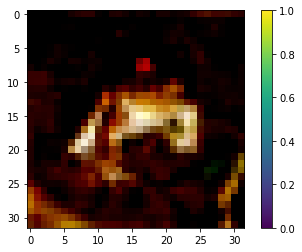

In [5]:
plt.imshow(train_x[0])
plt.colorbar()
plt.show()

> 위 이미지를 보았을때, CIFAR-10의 구성 객체중 무엇인지 구분이 가지 않는다.<br>
> -1 ~ 1 사이의 값으로 전처리하는 과정에서 색상 값 표현범위가 감소하며, 명암의 차이가 극명하게 나타나는 모습을 보여준다.<br>
> 추측해보면, 위가 갈색이고, 아래가 흰색이며, 다리같은게 있는것으로 보아, 사슴이 아닐까 생각해본다.<br>
> 필자가 여러 특징을 근거로 사슴을 유추한것처럼, 곧 만들 모델도 좋은 픽쳐맵을 추출하기를 바란다.

> 한가지 이미지로는 어떤 정보가 있는지 확인이 어려워 여러 이미지 데이터를 시각화 하는 작업을 진행했다.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

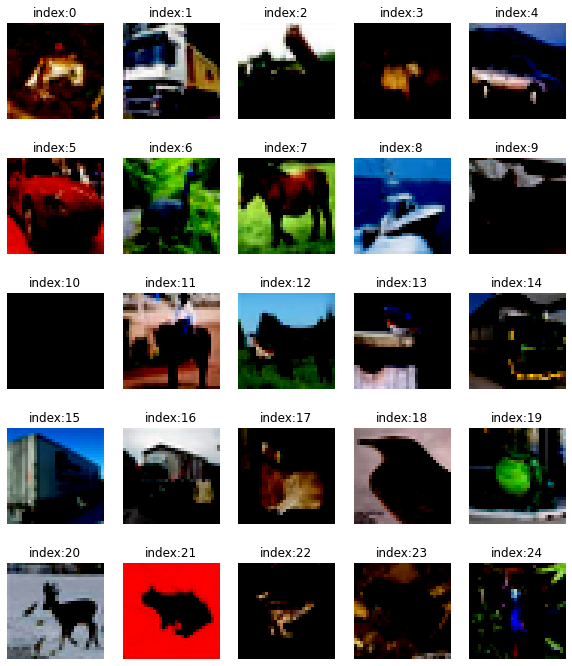

In [6]:
plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index:{i}')
    plt.axis('off')
plt.show()

> 트럭, 사슴, 자동차, 말, 개구리 등 CIFAR-10의 구성요소가 골고루 구성되어있음을 확인할 수 있다.

## 2.2 Data processing

> 데이터를 입력받을 입력 스트림 버퍼는 훈련용 데이터셋의 크기가 50,000이므로, 버퍼도 50,000으로 설정한다.<br>
> 50,000개를 전체 학습시 학습에 많은 시간이 소요되므로, 배치 사이즈를 512로 설정하여, 1회 훈련당 약 100회분을 학습하도록 설정한다.

In [7]:
BUFFER_SIZE = 50000
BATCH_SIZE = 512

> tf.data.Dataset 모듈의 from_tensor_slices() 함수를 활용하여 데이터를 랜덤하게 섞고, 배치크기만큼 mini-batch를 설정하는 작업을 진행한다.  이는, 신경망의 학습 속도를 증대시킴과 동시에 적절한 최적의 파라미터를 찾을수 있는 효과를 얻을 수 있다.

In [8]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

# 3. Make generator model

> 노이즈 이미지 백터를 기반으로 랜덤한 이미지를 생성하는 generator 모델을 설계 및 구현하는 과정을 진행한다.
> <br><br>
> [step.1 Dence layer] <br><br>
> 모델의 첫 입력값은 노이즈 백터가[1 ~ 100]사이값이므로 (100,)형식으로 구성한다.<br>
> 최종 16가지의 이미지가 출력될 수 있도록 (8 * 8 * 256)개의 Dence를 설정한다.<br>
> (8 * 8 * 256) / (32 * 32) = 16384/1025 = 16<br>
> 학습 단계의 BatchNormalization은 batch별 계산 목적으로 배치한다.<br>
> <br>
> =============================<br>
> <br>
> [step.2 Reshape layer] <br><br>
> Dence layer을 지나면 (256, 16384)형식의 벡터로 구성된다.<br>
> 이를 Convolutional layer가 계산할 수 있도록(8, 8, 256)형식의 백터로 재구성한다.<br>
> (512 * 16384) / (8 * 8 * 512) = 8,388,608 / 32,768 = 256 <br>
> <br>
> =============================<br>
> <br>
> [step.3~5 Conv2DTranspose layer] <br><br>
> Conv layer를 지나면 feature map이 작아지는것이 아닌, 커지는 Conv2DTranspose을 사용한다.<br>
> 추론 단계의 BatchNormalization은 각 feature map마다 일정 범위 내 가중치는 동일한 특징으로 분류할 수 있도록 정규화한다<br>
> 해당 레이어의 LeakyReLU()는 음수 값도 미미한 가중치 부여하는 역할을 수행한다.<br>

In [9]:
def make_generator_model():

    model = tf.keras.Sequential()

    # step1. Dense layer 구현
    # (8*8*256) / (32*32) = 16384/1025 = 최종 16가지 이미지 출력
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization()) # 학습 단계의 BN - batch별 계산 목적
    model.add(layers.LeakyReLU())

    # step2. Reshape layer 구현
    # (512, 16384) -> (8, 8, 256)
    # 8,388,608 / 32,768 = 256
    model.add(layers.Reshape((8, 8, 256)))

    # step3. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization()) # 추론 단계의 BN - 각 특징마다 일정 범위 내 가중치는 동일한 특징으로 분류할 수 있도록 정규화
    model.add(layers.LeakyReLU()) # 음수 값도 미미한 가중치 부여

    # step4. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(64, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # step5. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

> generator 모델을 인스턴화 한뒤 표로 시각화하면 다음과 같다.

In [10]:
generator = make_generator_model()

generator.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 16384)             1638400   
_________________________________________________________________
batch_normalization (BatchNo (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu (LeakyReLU)      (None, 16384)             0         
_________________________________________________________________
reshape (Reshape)            (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose (Conv2DTran (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_1 (Batch (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_1 (LeakyReLU)    (None, 8, 8, 128)         0

> generator모델을 그림으로 시각화하면 다음과 같다.

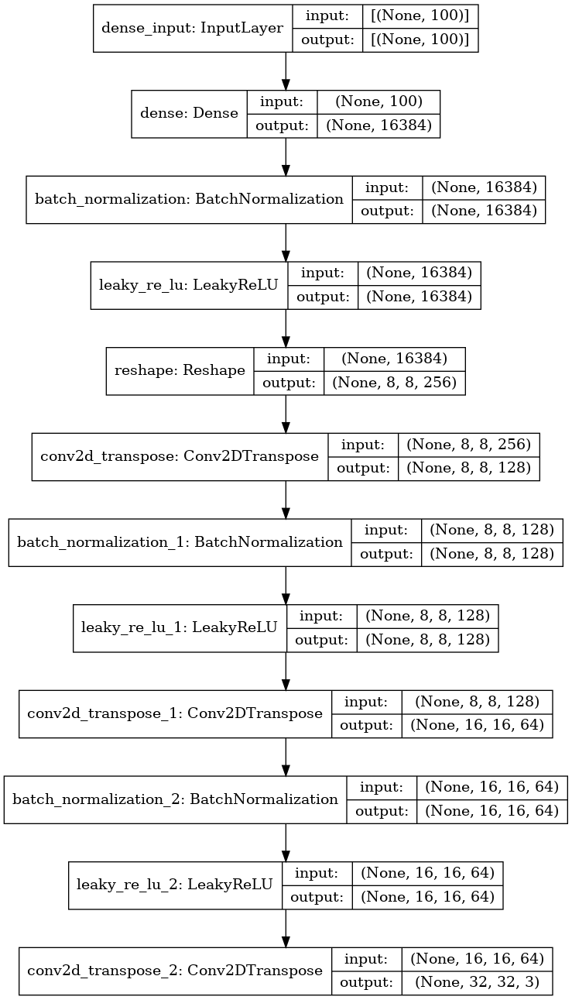

In [11]:
plot_model(generator, show_shapes=True)

> 위 과정으로 생성한 generator 모델을 활용하여, 랜덤한 노이즈 이미지 벡터를 입력한뒤 모델이 생성한 이미지를 확인하는 과정을 진행한다.

In [12]:
noise = tf.random.normal([1, 100])

> Generator model에 noise 입력 값과 훈련 시행 여부 매개변수 설정하여 임의로 생성된 이미지를 얻고 결과를 확인한다.

In [13]:
generated_image = generator(noise, training=False)

(1, 32, 32, 3)


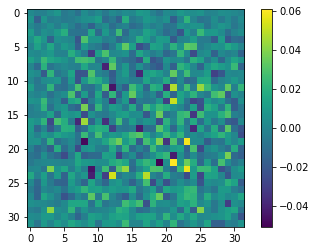

In [14]:
print(generated_image.shape)

plt.imshow(generated_image[0, :, :, 0])
plt.colorbar()
plt.show()

> 위 실험으로 32x32 크기의 노이즈 이미지가 잘 생성되었음을 확인할 수 있다.

# 4. Make discriminator model

> generator 모델이 생성한 노이즈 이미지 백터 입력받아 진위여부를 판독하는 discriminator 모델을 설계 및 구현하는 과정을 진행한다.
> <br><br>
> [step.1 ~ 2 Conv2D Layer] <br><br>
> generator가 생성한 이미지를 입력받아 각각 64, 128개의 특징 추출하는 Conv를 구현한다.<br>
> 음수 값도 미미한 가중치 부여하기 위해 LeakyReLU() 활성화 함수를 배치한다.<br>
> 임의의 노드 비활성화하여 오버피팅을 방지하기 위한 Dropout()을 30% 설정한다.<br>

In [15]:
def make_discriminator_model():
    model = tf.keras.Sequential()

    # step1. Conv2D Layer 구현
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # step2. Conv2D Layer 구현
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    # step3. Flatten Layer 구현
    model.add(layers.Flatten())

    # step4. Dense Layer 구현
    model.add(layers.Dense(1))

    return model

> discriminator 모델을 인스턴화 한뒤 표로 시각화하면 다음과 같다.

In [16]:
discriminator = make_discriminator_model()

discriminator.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_3 (LeakyReLU)    (None, 16, 16, 64)        0         
_________________________________________________________________
dropout (Dropout)            (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_4 (LeakyReLU)    (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 8, 8, 128)         0         
_________________________________________________________________
flatten (Flatten)            (None, 8192)             

> discriminator 모델을 그림으로 시각화하면 다음과 같다.

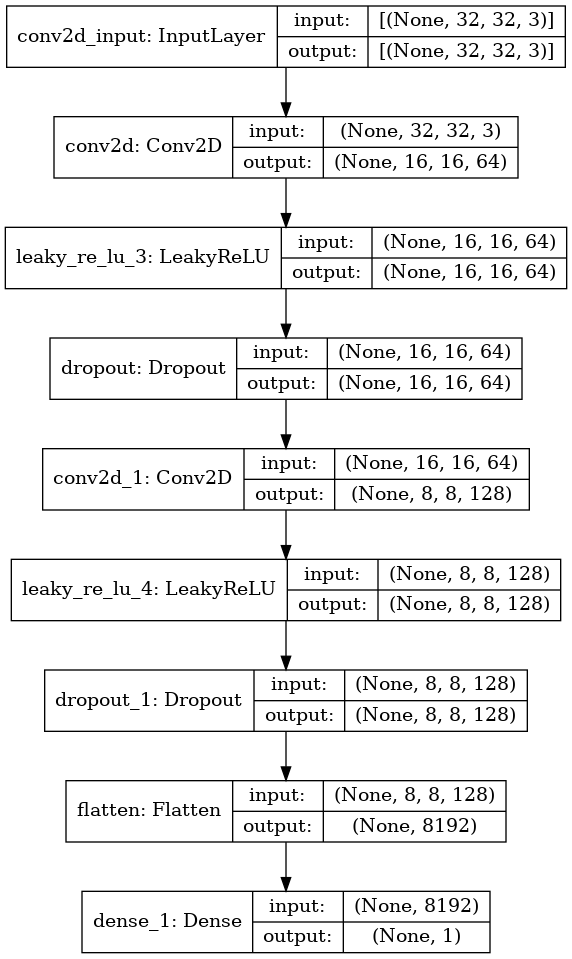

In [17]:
plot_model(discriminator, show_shapes=True)

> 위 과정으로 생성한 discriminator 모델 활용하여, generator모델이 생성한 노이즈 이미지를 입력받고,<br>
> 이미지의 진위여부를 판독하는 성능을 확인하는 과정을 진행한다.

In [18]:
decision = discriminator(generated_image, training=False)
decision

<tf.Tensor: shape=(1, 1), dtype=float32, numpy=array([[0.00342937]], dtype=float32)>

> discriminator 모델로부터 "-0.000748573"라는 결과값을 얻었다.<br>
> 아직은 이 값이 어떤 의미인지 확인할 수 없다.<br>
> 그래서, 판별자의 출력값을 활용하여 실제/생성(real/fake) 이미지 판별 정확도(accuracy)를 계산하는 함수를 구현하는 과정을 진행한다.

# 5. make loss funtion and accuracy, setting optimizer

## 5.1 make loss fuction

> 정확도를 계산하는 accuracy 함수를 구현하기 앞서, discriminator와 generator의 손실율을 구하는 함수를 선행 구현한다.<br<
> 이는 정확한 정확도를 계산하기 위해, 각 모델의 손실율을 알아야 하기 때문이다.

> discriminator의 최종 출력값은 이미지의 real/fake 여부를 0과 1로 판독하는 이진분류이므로, BinaryCrossentropy()을 사용한다.<br>
> Binary cross entropy는 두 개의 class 중 하나를 예측하는 작업에 대한 cross entropy의 special case기법이다.<br>
> 즉, 어떤 문제에 대해 특정 전략을 쓸 때 예상되는 입력값에 대한 기댓값 산출하는 방법이다.<br>
> + P.S. cross entropy는 서로 다른 두 확률분포에 대해 같은 사건이 가지는 정보량을 계산하는 기법이다.

In [19]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

### 5.1.1 generator loss fuction

> 위 작업으로 구현한 cross_entropy와 tf.ones_like()을 활용하여 generator의 손실율을 구하는 함수를 구현한다.<br>
> tf.ones_like() 함수는 입력 값과 모양이 같은 텐서 생성하는 기능을 수행한다.

In [20]:
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

> 위 작업으로 구현한 cross_entropy와 tf.ones_like(), tf.zeros_like()을 활용하여 discriminator의 손실율을 구하는 함수를 구현한다.<br>
> tf.zeros_like() - 모든 요소를 0으로 설정된 텐서 생성

### 5.1.2 discriminator loss fuction

In [21]:
def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

## 5.2 Make accuracy fuction

> Ganerator은 이미지 생성 여부가 성능의 척도가 아니므로, accuracy 함수를 구현하지 않는다.<br>
> 반면, Discriminator는 입력받은 이미지를 real/fake 여부를 성공적으로 판독하는것이 성능의 척도이므로 accuracy 함수를 구현해야한다.<br>
> 이에, discriminator의 정확도을 구하는 함수를 구현한다.<br>
> + tf.math.greater_equal() 함수는 요소별 조건(X > Y)을 만족하는 진리 값을 반환하는 기능을 수행한다.<br>
> + tf.cast() 함수는 - 텐서를 새로운 형태로 캐스팅하는 기능을 수행한다. (ex. 실수 -> 정수형 변환)<br>
> + tf.reduce_mean() 함수는 - 텐서의 요소의 평균을 반환하는 기능을 수행한다.

In [22]:
def discriminator_accuracy(real_output, fake_output):
    real_accuracy = tf.reduce_mean(tf.cast(tf.math.greater_equal(real_output, tf.constant([0.5])), tf.float32))
    fake_accuracy = tf.reduce_mean(tf.cast(tf.math.less(fake_output, tf.constant([0.5])), tf.float32))
    return real_accuracy, fake_accuracy

## 5.3 Setting optimizer

> Ganerator와 Discriminator의 최적화는 Adam으로 설정하고, 학습율은 1e-4(0.0001)로 설정한다.<br>
> GAN에서는 학습량이 많으므로 일반 모델과 같이 0.01~0.05 수치의 학습율은 오히려 오버피팅을 유발할 수 있다.

In [23]:
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# 6. Training model setup and feature implementation

> 본 장은 훈련 스텝당 수행 기능을 함수로 구현하고 입력 값의 하이퍼 파라미터를 설정 및 훈련 시 유용한 유틸리티 기능을 구현하는 과정을 기술한다.

## 6.1 Training model setup

> 위 2.2 데이터 전처리 과정에서 생성한 미니배치의 훈련 방법을 설계하는 train_step() 함수를 구현한다.
> train_step() 함수 구현 이전에 노이즈 이미지 벡터 값을 설정하는 작업을 선행한다.

In [24]:
# 노이즈 이미지 벡터 깊이 설정
noise_dim = 100

# generator에서 생성할 개수 설정
num_examples_to_generate = 16

seed = tf.random.normal([num_examples_to_generate, noise_dim])
print(seed.shape)

(16, 100)


> 위 작업으로, 노이즈 이미지 벡터는 100차원의 깊이를 가지며, generator모델에서 1회 출력시 16개의 노이즈 이미지 벡터를 생성한다.<br>
> 위 설정 값을 활용하여 미니 배치 훈련 시 수행할 기능을 구현하는  train_step()를 구현한다.

In [25]:
@tf.function # Tensorflow graph 모드 compile
def train_step(images):
    # step1.입력 값 노이즈 이미지 생성 [512, 100]
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # step2. 노이즈 이미지 생성
        generated_images = generator(noise, training=True)

        # step3. 노이즈 이미지 진위여부 판독
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # step4. loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        # step5. accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    # step6. 가중치 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # step7. 가중치 업데이트 = 모델 학습
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy

## 6.2 Save image from generator

> Generato 모델이 훈련 과정 동안 생성한 16개의 이미지를 저장하는 함수를 구현한다.<br>
> 이는 향후, Generator 모델이 생성한 이미지가 개선되는 모습을 GIF 파일로 만드는데 사용한다.

In [26]:
def generate_and_save_images(model, epoch, it, sample_seeds):
    predictions = model(sample_seeds, training=False)
    fig = plt.figure(figsize=(4, 4))
    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow(tf.reshape(tf.dtypes.cast(predictions[i] * 127.5 + 127.5, tf.int64), [32,32,3]))
        plt.axis('off')

    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample_epoch_{:04d}_iter_{:03d}.png'.format(os.getenv('HOME'), epoch, it))
    plt.show()

## 6.3 Set check point

> 학습에 많은 시간이 소요되는 GAN 모델은 예기치 않은 문제로 학습이 중단되었을때, 리스크가 매우 크다.<br>
> 이를 방지하고 연구자가 원하는 지점의 훈련 지점에 엑세스 할 수 있도록 일정 훈련마다 모델을 저장하는 check point  기능을 구현한다.<br>
> check point에는 Generator과, Discriminator 모델, 그리고 각 모델의 옵티마이저가 저장된다.

In [27]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## 6.4 Draw train result

> 학습 회수가 많은 GAN 모델은 유의미한 loss rate와 accuracy rate 정보를 얻을 수 있을것이다.<br>
> 이에, Generator과, Discriminator 모델의 정확도와 손실율 정보를 시각화된 표로 출력하는 함수를 구현한다.

In [28]:
rcParams['figure.figsize'] = 15, 6

def draw_train_history(history, epoch):
    plt.subplot(211)  
    plt.plot(history['gen_loss'])  
    plt.plot(history['disc_loss'])  
    plt.title('model loss')  
    plt.ylabel('loss')  
    plt.xlabel('batch iters')  
    plt.legend(['gen_loss', 'disc_loss'], loc='upper left')  

    plt.subplot(212)  
    plt.plot(history['fake_accuracy'])  
    plt.plot(history['real_accuracy'])  
    plt.title('discriminator accuracy')  
    plt.ylabel('accuracy')  
    plt.xlabel('batch iters')  
    plt.legend(['fake_accuracy', 'real_accuracy'], loc='upper left')  
    
    plt.savefig('{}/aiffel/dcgan_newimage/cifar10/training_history/train_history_{:04d}.png'
                    .format(os.getenv('HOME'), epoch))
    plt.show()

# 7. Model train

## 7.1 Function check

> 훈련을 진행하기 앞서, 1장부터 6장까지 진행한 과정이 정상적으로 수행되었는지 확인하는 중간 점검을 시행한다.
cifar10

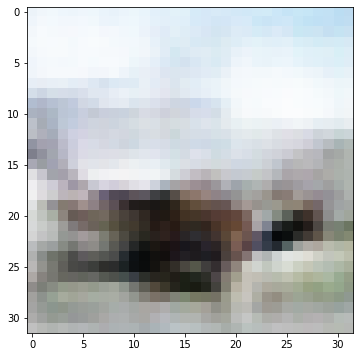

In [29]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'

latest = tf.train.latest_checkpoint(checkpoint_dir)
checkpoint.restore(latest)

generator = checkpoint.generator
discriminator = checkpoint.discriminator

# 로드한 모델이 정상적으로 이미지를 생성하는지 확인해 봅니다. 
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)

np_generated = generated_image.numpy()
np_generated = (np_generated * 127.5) + 127.5   # reverse of normalization
np_generated = np_generated.astype(int)
plt.imshow(np_generated[0])
plt.show()  # 정상적으로 모델이 로드되었다면 랜덤 이미지가 아니라 CIFAR-10 이미지가 그려질 것입니다.

## 7.2 make train()

> 모델을 훈련하고, 훈련과정과 체크포인트와, 소요 시간 기록, 진행 현황을 시각화하는 train() 코드를 구현한다.

In [29]:
def train(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)

                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

> AIFFEL LMS에서 요구한 epoch 50회를 설정하고, epoch 5회마다 check point를 설정한다.

In [31]:
save_every = 5
EPOCHS = 50 

tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

# 7.3 Train

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

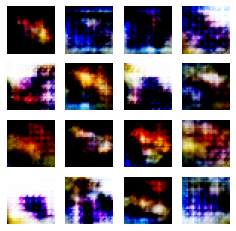

Time for training : 1369 sec


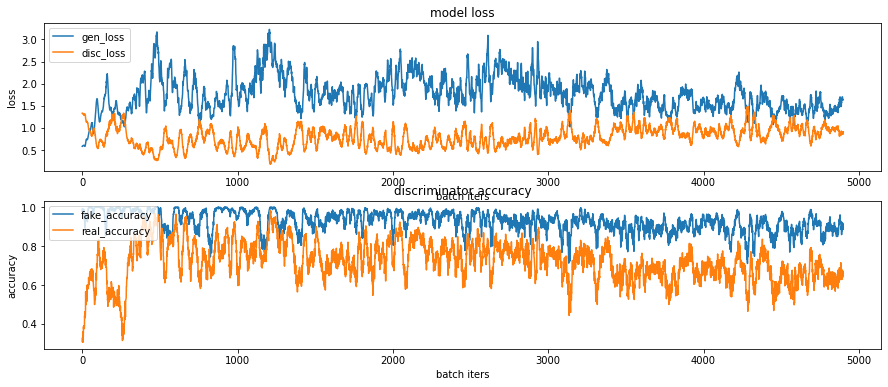

CPU times: user 17min 6s, sys: 6min 8s, total: 23min 14s
Wall time: 22min 50s


In [41]:
%%time

train(train_dataset, EPOCHS, save_every)

# 8. result

> 50회의 훈련과정에서 생성한 이미지를 gif로 생성하여 학습 과정을 시각화하는 코드를 구현했다.

In [42]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/epoch50.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.7)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

> 50회의 학습과정을 시각화 한 결과는 아래 영상과 같다.

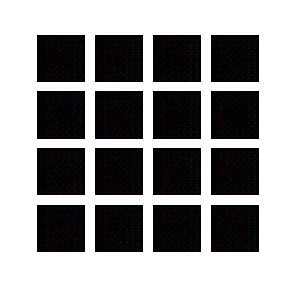

https://8888-wc7jz8wmsofa7cmnn6r26fwv3.c1.prod.connect.ainize.ai/files/aiffel/dcgan_newimage/cifar10/epoch50.gif

> 50회 훈련 결과, 유의미한 정보가 있는 사진을 생성한것 같지는 않다.<br>
> 몇몇개의 사진은 트럭이나 자동차의 형태를 간신히 인식할수 있는 이미지를 생성하기도 했다.<br>
> 오류율은 생성자는 1.5대, 판별자는 0.9대를 보여주며 꽤 준수한 수치를 보여주었다.<br>
> 판독자가 가짜이미지를 판별하는 성능은 0.65대로 괜찮은 성능을 보여주었으나,<br>
> fake_accuracy가 1에 가까운것으로 보아, 판독자의 성능이 나빠서 정확율이 낮은것이라는걸 확인할 수 있다.<br>

# 9. 모델 개선

> 기존 모델의 성능을 개선하기 위하여 아래와 같은 변경점을 추가하여 재 학습 후 성능을 비교하는 연구를 진행하고자 한다.<br>
> + 이미지 정규화 |  기존 : 정규화 시행 -> 변경 후 : 이미지 정규화 미실행<br>
> + batch_size |  기존 : 512 -> 변경 후 : 2048 (4배)<br>
> + epoch |  기존 : 50 -> 변경 후 : 1,000 (20배)<br>
> + optimazer learning rate |  기존 :  0.0001 -> 변경 후 : 0.001 (10배)
> + dropout |  기존 : 30% -> 변경 후 : 10% (1/3 배)

> 대부분 GAN은 Epochs가 많아야 좋은 성능을 보여주는 경우가 많다.<br>
> 기존 설정 값으로 유의미한 성능을 나타내기 위해선 10,000회 이상의 고반복 epoch가 필요할것이라 생각한다.<br>
> 그러나, 개인 PC로는 한계가 있기에, 일부러 훈련 속도를 높여, 고반복 epoch를 진행한 효과를 보고자 한다.

## 9.1 cifar10 data load

> 가공되지 않은 원본 cifar10을 다시 메모리에 적재 후 훈련용과 테스트용으로 데이터 셋을 분류한다

In [32]:
cifar10 = tf.keras.datasets.cifar10

(train_x, _), (test_x, _) = cifar10.load_data()

## 9.2 check data

> 기존 모델은 1 ~ -1 범위로 기존 이미지 데이터의 픽셀 값을 정규화했다.<br>
> 그러나, 정규화를 하지 않은 데이터도 해상도가 낮아 이미지가 선명하지 않고,<br>
> 저해상도 이미지로 인해 객체를 구별할 수 있는 특징이 손실된 정도도 높으며,<br>
> 정규화된 이미지 데이터는 사람이 봐도 구별이 쉽지 않을정도로 이미지가 훼손된다.<br>
> 때문에, 정규화 하지 않은 이미지 데이터를 활용하여 모델을 학습하고자 한다.<br>
> 정규화 하지 않은 이미지 데이터를 시각화한 결과는 아래와 같다.

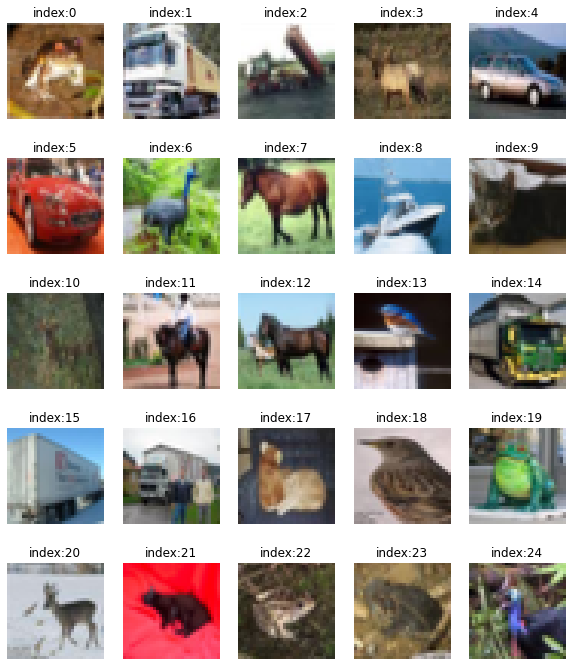

In [33]:
plt.figure(figsize=(10, 12))

for i in range(25):
    plt.subplot(5, 5, i+1)
    plt.imshow(train_x[i])
    plt.title(f'index:{i}')
    plt.axis('off')
plt.show()

> 확실히 정규화 된 이미지보다 객체를 식별하는데 용이해졌음을 확인할 수 있다.<br>
> 본 연구생은 이전에 정규화된 index : 0 번 이미지를 본 후 사슴이라고 추론했으나<br>
> 정규화 하지 않은 이미지를 본 후, 개구리이였음을 식별할 수 있었다.

> 이어서, 기획한 설정 값인 배치 사이즈를 기존 512에서 1024로 2배 증가하여 재설정 했다.

In [7]:
BUFFER_SIZE = 50000
BATCH_SIZE = 2048

> 재 설정한 배치 사이즈에 맞추어 데이터 세트를 재구성한다

In [111]:
train_dataset = tf.data.Dataset.from_tensor_slices(train_x).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)

## 9.3 reMake generator model

> generator의 일부 하이퍼 파라미터를 변경하기 위해, 별도의 함수를 구현했다.<br>
> Dense layer의 개수가 기존(512)보다 2배 증가했으며 이에 맞추어 reshape layer도 동일한 1024을 설정했다.

In [112]:
def make_generator_model2():

    model = tf.keras.Sequential()

    # step1. Dense layer 구현
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # step2. Reshape layer 구현
    model.add(layers.Reshape((8, 8, 256)))

    # step3. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(128, kernel_size=(5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    # step4. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(128,kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())
    
    # step7. Conv2DTranspose layer 구현
    model.add(layers.Conv2DTranspose(3, kernel_size=(5, 5), strides=(2, 2), padding='same', use_bias=False, \
                                     activation='tanh'))

    return model

> 두번째 generator 모델을 인스턴화 한뒤 표로 시각화하면 다음과 같다.

In [113]:
generator = make_generator_model2()

generator.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_16 (Dense)             (None, 16384)             1638400   
_________________________________________________________________
batch_normalization_24 (Batc (None, 16384)             65536     
_________________________________________________________________
leaky_re_lu_40 (LeakyReLU)   (None, 16384)             0         
_________________________________________________________________
reshape_8 (Reshape)          (None, 8, 8, 256)         0         
_________________________________________________________________
conv2d_transpose_24 (Conv2DT (None, 8, 8, 128)         819200    
_________________________________________________________________
batch_normalization_25 (Batc (None, 8, 8, 128)         512       
_________________________________________________________________
leaky_re_lu_41 (LeakyReLU)   (None, 8, 8, 128)       

> 두번째 generator 모델을 그림으로 시각화하면 다음과 같다.

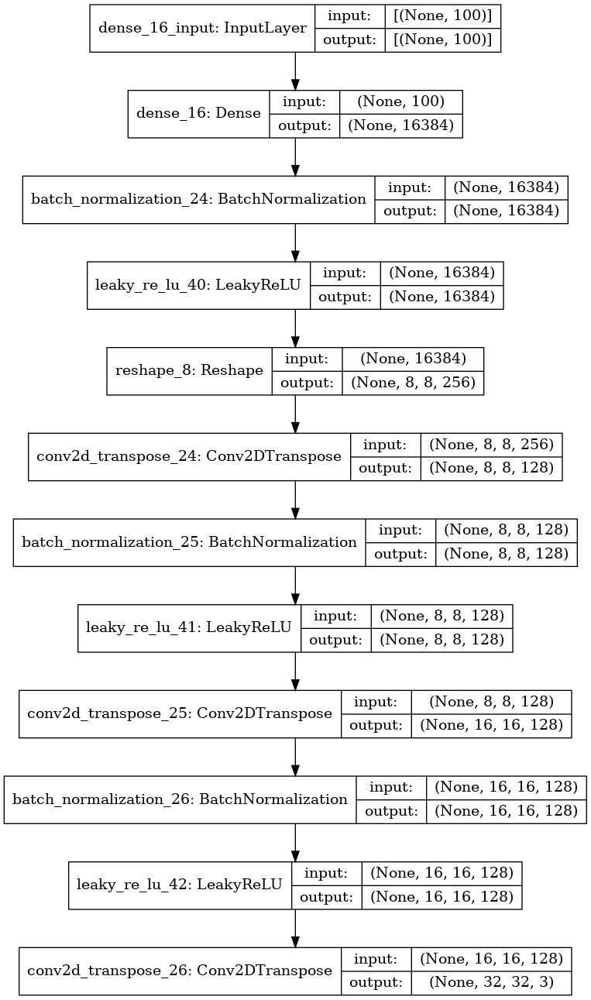

In [114]:
plot_model(generator, show_shapes=True)

## 9.4 reMake discriminator model

> discriminator의 일부 하이퍼 파라미터를 변경하기 위해, 별도의 함수를 구현했다.<br>
> Conv2D layer의 픽쳐 맵 하이퍼 파라미터 개수를 기존(128, 256)보다 2배 씩 늘려 설정했다.
> 또한 기존 드롭아웃율 30%를 10%로 낮추어 학습 속도를 높이고자 한다.

In [115]:
def make_discriminator_model2():
    model = tf.keras.Sequential()

    # step1. Conv2D Layer 구현
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.1))

    # step2. Conv2D Layer 구현
    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.1))

    # step3. Flatten Layer 구현
    model.add(layers.Flatten())

    # step4. Dense Layer 구현
    model.add(layers.Dense(1))

    return model

> discriminator 모델을 인스턴화 한뒤 표로 시각화하면 다음과 같다.

In [116]:
discriminator = make_discriminator_model2()

discriminator.summary()

Model: "sequential_17"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_16 (Conv2D)           (None, 16, 16, 64)        4864      
_________________________________________________________________
leaky_re_lu_43 (LeakyReLU)   (None, 16, 16, 64)        0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 16, 16, 64)        0         
_________________________________________________________________
conv2d_17 (Conv2D)           (None, 8, 8, 128)         204928    
_________________________________________________________________
leaky_re_lu_44 (LeakyReLU)   (None, 8, 8, 128)         0         
_________________________________________________________________
dropout_17 (Dropout)         (None, 8, 8, 128)         0         
_________________________________________________________________
flatten_8 (Flatten)          (None, 8192)            

> discriminator 모델을 그림으로 시각화하면 다음과 같다.

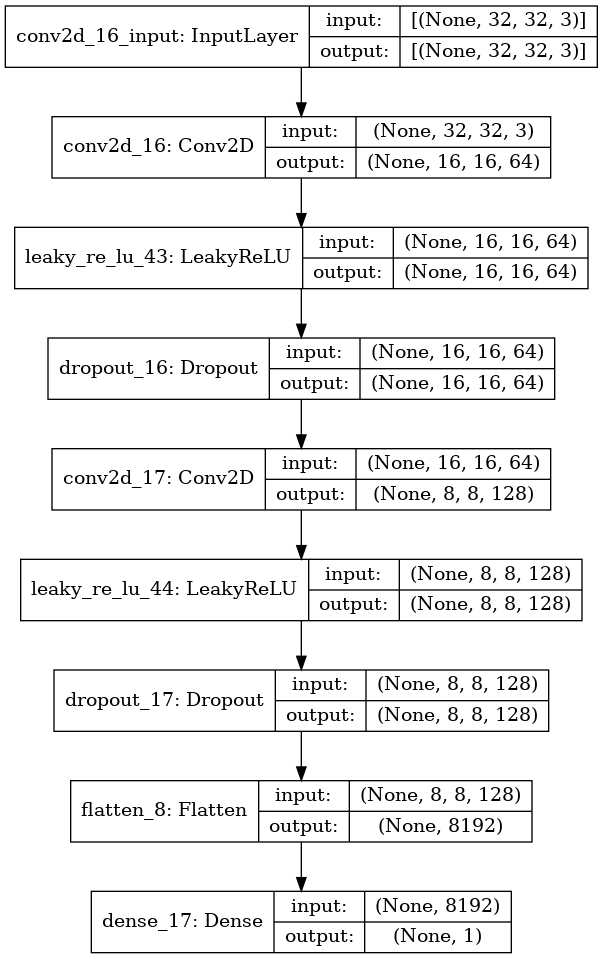

In [117]:
plot_model(discriminator, show_shapes=True)

## 9.5 Setting optimizer

> 기존의 옵티마이저를 사용하려 하면, tensorflow 프레임 워크에서 재사용을 할수 없다는 오류를 출력한다.<br>
> 구글 검색 및 각종 개발자 커뮤니티의 답변은 텐서플로우 자체의 버그라고 한다.<br>
> 이에 기존(rate = 0.0001) 옵티마이저의 10배의 학습율을 설정하고 별도의 옵티마이저 변수를 할당했다.

In [118]:
generator_optimizer2 = tf.keras.optimizers.Adam(1e-3)
discriminator_optimizer2 = tf.keras.optimizers.Adam(1e-3)

## 9.6 remake train setup

> 변경된 옵티마이저 변수 적용을 위해 별도의 train_step()을 재구현했다.

In [119]:
@tf.function # Tensorflow graph 모드 compile
def train_step2(images):
    # step1.입력 값 노이즈 이미지 생성 [2048, 100]
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        # step2. 노이즈 이미지 생성
        generated_images = generator(noise, training=True)

        # step3. 노이즈 이미지 진위여부 판독
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        # step4. loss 계산
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

        # step5. accuracy 계산
        real_accuracy, fake_accuracy = discriminator_accuracy(real_output, fake_output) 
    
    # step6. 가중치 계산
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    # step7. 가중치 업데이트 = 모델 학습
    generator_optimizer2.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer2.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))

    return gen_loss, disc_loss, real_accuracy, fake_accuracy

## 9.7 set check point

> 변경된 옵티마이저 변수 적용을 위해 check point의 파라미터를 재설정했다.

In [120]:
checkpoint_dir = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")

checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer2,
                                 discriminator_optimizer=discriminator_optimizer2,
                                 generator=generator,
                                 discriminator=discriminator)

## 9.8 remake train()

> 변경된 train_step()을 적용하기 위해 별도의 train()을 재구현했다.

In [121]:
def train2(dataset, epochs, save_every):
    start = time.time()
    history = {'gen_loss':[], 'disc_loss':[], 'real_accuracy':[], 'fake_accuracy':[]}

    for epoch in range(epochs):
        epoch_start = time.time()
        for it, image_batch in enumerate(dataset):
            gen_loss, disc_loss, real_accuracy, fake_accuracy = train_step2(image_batch)
            history['gen_loss'].append(gen_loss)
            history['disc_loss'].append(disc_loss)
            history['real_accuracy'].append(real_accuracy)
            history['fake_accuracy'].append(fake_accuracy)

            if it % 50 == 0:
                display.clear_output(wait=True)

                generate_and_save_images(generator, epoch+1, it+1, seed)
                print('Epoch {} | iter {}'.format(epoch+1, it+1))
                print('Time for epoch {} : {} sec'.format(epoch+1, int(time.time()-epoch_start)))

        if (epoch + 1) % save_every == 0:
            checkpoint.save(file_prefix=checkpoint_prefix)

        display.clear_output(wait=True)
        generate_and_save_images(generator, epochs, it, seed)
        print('Time for training : {} sec'.format(int(time.time()-start)))

        draw_train_history(history, epoch)

> 이전 모델이 부족한 훈련 횟수로 제대로 된 성능을 보여주지 못했다.<br>
> 이에, 기존보다 배치 사이즈를 2배 증가하고, 옵티마이저의 훈련율을 5배 높여 재설정했다.<br>
> 그리고, 이번 epoch 설정에서는 기존 훈련 횟수(50회)의 4배인 200회를 설정하였다.

In [30]:
save_every = 50
EPOCHS = 1000 

tf.config.list_physical_devices("GPU")

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

## 9.9 train

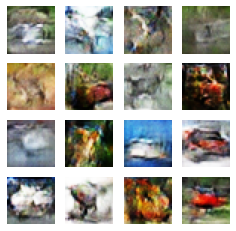

Time for training : 27809 sec


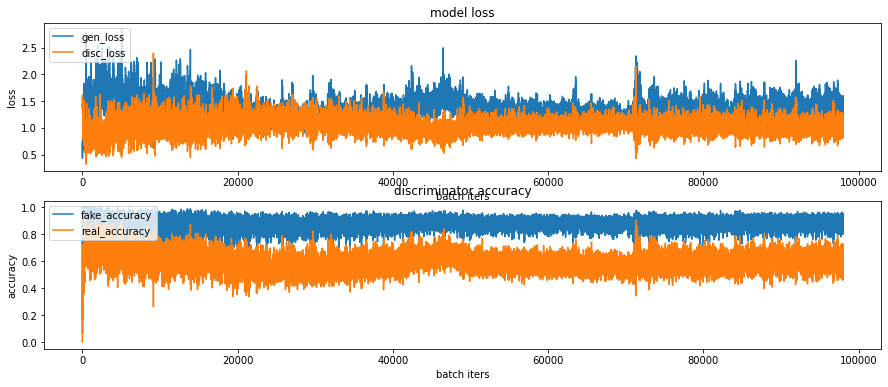

CPU times: user 5h 57min 38s, sys: 1h 53min 2s, total: 7h 50min 40s
Wall time: 7h 43min 34s


In [31]:
%%time

train(train_dataset, EPOCHS, save_every)

> 1,000회의 훈련과정에서 생성한 이미지를 gif로 생성하여 학습 과정을 시각화하는 코드를 구현했다.

In [32]:
anim_file = os.getenv('HOME')+'/aiffel/dcgan_newimage/cifar10/epoch1000.gif'

with imageio.get_writer(anim_file, mode='I') as writer:
    filenames = glob.glob('{}/aiffel/dcgan_newimage/cifar10/generated_samples/sample*.png'.format(os.getenv('HOME')))
    filenames = sorted(filenames)
    last = -1
    for i, filename in enumerate(filenames):
        frame = 2*(i**0.7)
        if round(frame) > round(last):
            last = frame
        else:
            continue
        image = imageio.imread(filename)
        writer.append_data(image)
    image = imageio.imread(filename)
    writer.append_data(image)

> 1,000회의 학습과정을 시각화 한 결과는 아래 영상과 같다.
> 이전 모델은 유의미한 정보를 생성하지 못한것에 비해, 이번 모델은 유의미한 정보를 생성한 모습을 보여주었다.

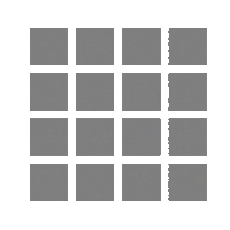

> 위 gif를 통해 생성기가 생성한 이미지를 육안으로 식별해보았을떄 아래 상세표와 같다<br>

|1열|2열|3열|4열|
|-----|-----|-----|-----|
|1|2|3|4|
|5|6|7|8|
|9|10|11|12|
|13|14|15|16|

> 01. 자동차의 뒷면을 생성한 모습이다.<br>
> 02. 새? 비행기?를 생성한 모습같다,<br>
> 03. 고양이의 얼굴을 확대하여 생성한 모습이다.<br>
> 04. 세단 자동차의 뒷면을 생성한 모습이다.<br>
> 05. 갈색 고양이 or 갈색 말을 생성한 듯한 모습이다.<br>
> 06. 말의 얼굴 실루엣 모습을 생성한 듯하다.<br>
> 07. 말의 얼굴을 생성한듯 하다.<br>
> 08. 동물의 얼굴을 생성한듯 하다.<br>
> 09. 자동차 뒷모습을 생성한 모습이다.<br>
> 10. 고양이 or 개의 얼굴을 생성한듯 하다.<br>
> 11. 은색 자동차의 뒷면과 하늘을 생성한 모습이다.<br>
> 12. 자동차의 뒷면을 생성한 듯한 모습이다.<br>
> 13. 자동차의 실루엣을 확인할 수 있다.<br>
> 14. 강아지의 얼굴을 확대한 모습이다.<br>
> 15. 고양이의 귀같은게 보이는걸로 보아, 고양이를 생성한듯 하다.<br>
> 16. 자동차의 옆면을 생성한듯 하다.

> + 이미지 정규화 |  기존 : 정규화 시행 -> 변경 후 : 이미지 정규화 미실행<br>
> + batch_size |  기존 : 512 -> 변경 후 : 2048 (4배)<br>
> + epoch |  기존 : 50 -> 변경 후 : 1000 (20배)<br>
> + optimazer learning rate |  기존 :  0.0001 -> 변경 후 : 0.001 (10배)
> + dropout |  기존 : 30% -> 변경 후 : 10% (1/3 배)

> 위 조건으로 1,000회 훈련 결과, 오브젝트를 육안으로 식별할 수 있는 생성한 모습을 확인 할 수 있다.<br>
> gif의 사진에는 자동차나 동물의 모습을 주로 생성하는 모습을 보여주었다.<br>
> 최종 오류율은 생성기는 1.1대, 판별자는 0.7대를 보여주며 이전 모델보다 0.4씩 낮은 오류율을 보여주었다.<br>
> 최종 정답율은 생성기 : 약 75%, 판독기 약 70%대의 모습을 보여주었다.<br>
> 이전 모델은 fake_accuracy가 1에 근접했으나, 이번 모델은 0.8 정도로, 이전 대비 20%가 감소한 모습을 보여주었다.<br>
> 이는, 생성기의 정답율은 낮아졌으며, 판독기의 정답율은 올라가며, 이전 모델보다 편차가 줄었음을 보여주었다.

# 후기

> 본 프로젝트의 GAN은 기존 CNN, RNN 모델에 비해 학습에 훨씬 많은 시간이 소요되었습니다.<br>
> GAN 모델의 훈련의 횟수가 높아질수록 더 개선된 이미지를 출력해주는 모습을 확인할 수 있었습니다.<br>
> 위 정보를 토대로, 초기 실험에는 100~300회의 훈련 횟수로 모델을 학습해보았으나, 유의미한 정보를 출력하지 못했습니다.<br>
> 이에, 10,000회 이상의 고반복 훈련을 기획했으나, 훈련시간이 매우 오래 걸리고, AIFFEL 클라우드가 간헐적으로 끊기는 현상이 나타났을때,<br>
> 학습 내용이 소실되는 문제가 있어, 고반복 훈련과 같은 성능을 내기 위한 하이퍼 파라미터 튜닝을 시도했습니다.<br>
> 기존 하이퍼 파라미터 보다, 학습 율을 높이고, 배치 사이즈를 늘려 1회 훈련마다 정확도를 높이는 방법은 꽤 좋은 결과를 보여주었습니다.<br>
> 이처럼, 고반복 훈련이 필요한 모델에 빠른 결과를 보고싶을때는 위 방법을 사용하는것도 좋다는 경험을 얻었습니다.